In [5]:
import numpy as np
import os
import PIL
import PIL.Image
import tensorflow as tf
import os
print(tf. __version__)

2.0.0


In [2]:
import pathlib
train_dir = "datasets/train/"
train_dir = pathlib.Path(train_dir)
val_dir = "datasets/val/"
val_dir = pathlib.Path(val_dir)

In [4]:
batch_size = 20
img_height = 224
img_width = 224

# Load training and validation set
train_ds = tf.keras.utils.image_dataset_from_directory(
  train_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

val_ds = tf.keras.utils.image_dataset_from_directory(
  val_dir,
  seed=123,
  image_size=(img_height, img_width),
  batch_size=batch_size)

AttributeError: module 'tensorflow_core.keras.utils' has no attribute 'image_dataset_from_directory'

In [ ]:
# Add Data Augmentation

['cat', 'dog']


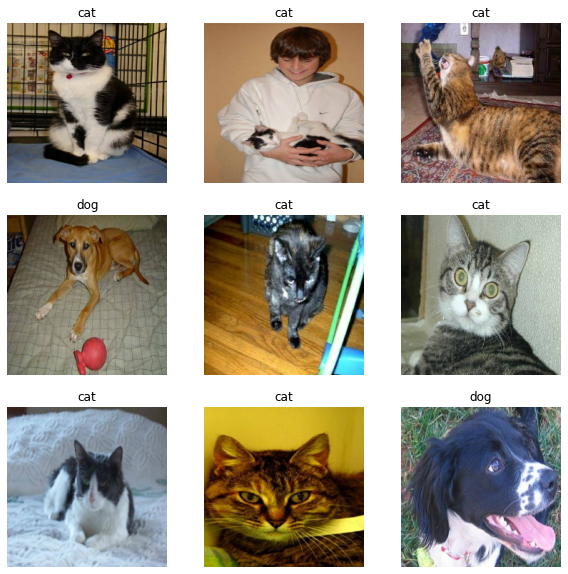

In [ ]:
import matplotlib.pyplot as plt
# Visualize data from training/validation set
class_names = train_ds.class_names 
print(class_names)

plt.figure(figsize=(10, 10))
for images, labels in val_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
for image_batch, labels_batch in train_ds:
  print(image_batch.shape)
  print(labels_batch.shape)
  break

(20, 224, 224, 3)
(20,)


In [ ]:
AUTOTUNE = tf.data.AUTOTUNE

train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

In [ ]:
# Initialize ResNet50 layers with ImageNet weight (pre-trained)

num_classes = 2

cnn_layers = tf.keras.applications.resnet.ResNet50(
    include_top=False,
    input_shape = (224, 224, 3),
    weights='imagenet',
    pooling='avg',
    classes=num_classes,
)

94781440/94765736 [==============================] - 1s 0us/step


In [ ]:
# add the fully-connected layers
rescale = tf.keras.layers.Rescaling(1./255)

dense_1 = tf.keras.layers.Dense(64, activation='relu')
dense_2 = tf.keras.layers.Dense(2, activation='softmax')

model = tf.keras.models.Sequential([rescale, cnn_layers, dense_1, dense_2])
model.build(input_shape = (None, 224, 224, 3))

In [ ]:
# Optimizer and Loss function

lr_schedule = tf.keras.optimizers.schedules.PolynomialDecay(
    initial_learning_rate = 0.0002,
    decay_steps = 1000,
    end_learning_rate = 0.00002,
    power=1.0,
    cycle=False,
    name=None
)

optimizer = tf.keras.optimizers.Adam(learning_rate = lr_schedule)

model.compile(
  optimizer=optimizer,
  loss='sparse_categorical_crossentropy',
  metrics=['accuracy'])

In [ ]:
# Freeze the ResNet50 layers

for layer in cnn_layers.layers:
    layer.trainable = False

# Model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 dense (Dense)               (None, 64)                131136    
                                                                 
 dense_1 (Dense)             (None, 2)                 130       
                                                                 
Total params: 23,718,978
Trainable params: 131,266
Non-trainable params: 23,587,712
_________________________________________________________________


In [ ]:
import datetime

dir = "trained_models/ResNet50_12epochs/" + datetime.datetime.now().strftime("%Y%m%d-%H%M")
os.makedirs(dir)
log_dir = os.path.join(dir, "tensorboard")

print(log_dir)

trained_models/ResNet50_12epochs/20220929-0719/tensorboard


In [ ]:
%tensorboard --logdir /content/drive/MyDrive/trained_models/ResNet50_12epochs/20220927-0739/tensorboard

In [ ]:
# Callbacks. Uncomment this to save checkpoint. 
# checkpoint_filepath = "/content/drive/MyDrive/trained_models/epoch_{epoch:02d}.ckpt"
# checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_filepath,
#                                                         save_weights_only=True,
#                                                         verbose=1)

tensorboard_callback = tf.keras.callbacks.TensorBoard(
                            log_dir=log_dir,
                            update_freq = 100)

# Train the first 6 epochs
# only the Fully-Connected layers are trained
# the CNNs layer are freezed

epochs = 2

# model.fit(
#   train_ds,
#   validation_data=val_ds,
#   epochs=epochs,
#   callbacks=[checkpoint_callback]
# )

model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  callbacks=[tensorboard_callback]
)

model.save(dir + "/model_cnn_freezed.h5")

Epoch 1/2
1000/1000 [==============================] - 2000s 2s/step - loss: 0.1648 - accuracy: 0.9348 - val_loss: 0.0773 - val_accuracy: 0.9720
Epoch 2/2
1000/1000 [==============================] - 139s 139ms/step - loss: 0.0646 - accuracy: 0.9747 - val_loss: 0.0457 - val_accuracy: 0.9830


In [ ]:
# add visualization of evaluation

In [ ]:
# Unfreeze the ResNet50 layers

for layer in cnn_layers.layers:
    layer.trainable = True

# Model summary
model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 224, 224, 3)       0         
                                                                 
 rescaling (Rescaling)       (None, 224, 224, 3)       0         
                                                                 
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 dense (Dense)               (None, 64)                131136    
                                                                 
 dense_1 (Dense)             (None, 2)                 130       
                                                                 
Total params: 23,718,978
Trainable params: 23,665,858
Non-trainable params: 53,120
_________________________________________________________________


In [ ]:
# # Train the next 6 epochs
# # only the Fully-Connected layers are trained
# # the CNNs layer are freezed

# Callbacks. Uncomment this to save checkpoint. 
# checkpoint_filepath = "/content/drive/MyDrive/trained_models/epoch_{epoch:02d}.ckpt"
# checkpoint_callback = tf.keras.callbacks.ModelCheckpoint(checkpoint_filepath,
#                                                         save_weights_only=True,
#                                                         verbose=1)
# Train the first 6 epochs
# only the Fully-Connected layers are trained
# the CNNs layer are freezed

epochs = 4

# model.fit(
#   train_ds,
#   validation_data=val_ds,
#   epochs=epochs,
#   callbacks=[checkpoint_callback]
# )

model.fit(
  train_ds,
  validation_data=val_ds,
  epochs=epochs,
  initial_epoch = 2,
  callbacks=[tensorboard_callback]
)

model.save(dir + "/model_full.h5")

Epoch 3/4
1000/1000 [==============================] - 139s 139ms/step - loss: 0.0502 - accuracy: 0.9808 - val_loss: 0.0454 - val_accuracy: 0.9818
Epoch 4/4
1000/1000 [==============================] - 139s 139ms/step - loss: 0.0390 - accuracy: 0.9854 - val_loss: 0.0442 - val_accuracy: 0.9812


In [ ]:
model = tf.keras.models.load_model(dir + "/model_full.h5")

KeyboardInterrupt: ignored

In [ ]:
img_height = 224
img_width = 224

In [ ]:
# Inference on Test set

from PIL import Image
import glob
image_list = []
for filename in glob.glob('datasets/test/*.jpg'): 
    im=Image.open(filename)
    image_array = np.array(im)
    image_array = tf.image.resize(
        image_array,
        (img_height, img_width),
    )
    image_list.append(image_array)


In [ ]:
len(image_list)

In [ ]:
predictions = model.predict(np.array(image_list))
predictions = np.argmax(predictions, axis=1) 

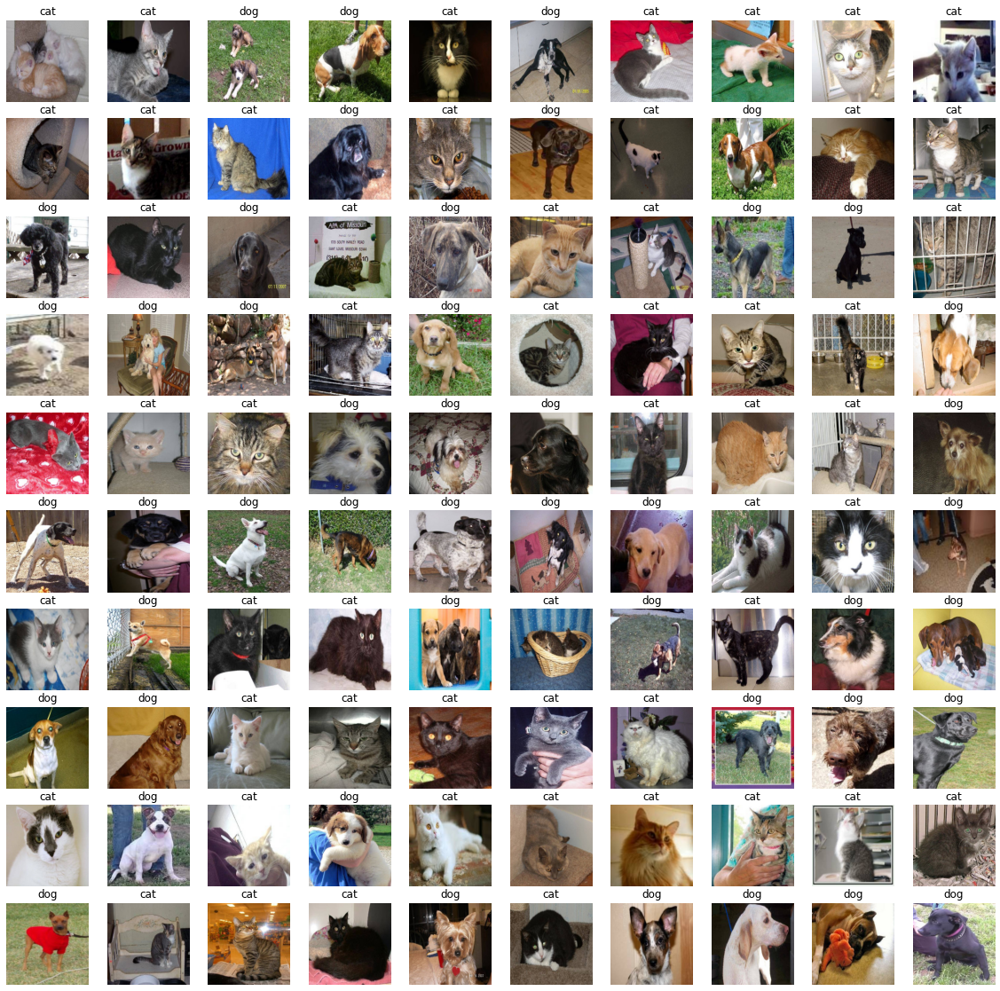

In [ ]:
class_names = ['cat', 'dog']

from matplotlib import pyplot as plt

plt.figure(figsize=(20, 20))
for i in range(100):
  ax = plt.subplot(10, 10, i + 1)
  plt.imshow(image_list[i].numpy().astype("uint8"))
  label = predictions[i]
  plt.title(class_names[label])
  plt.axis("off")

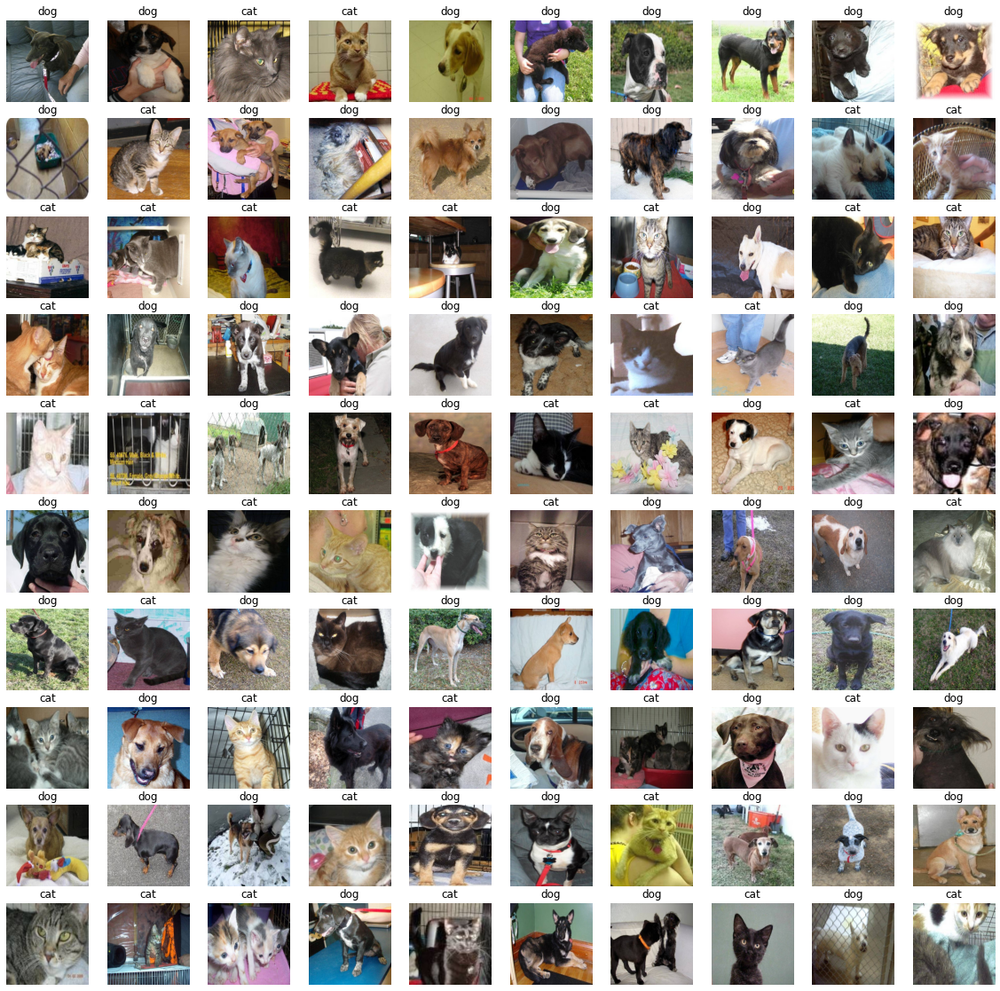

In [ ]:
plt.figure(figsize=(20, 20))
for i in range(100, 200):
  ax = plt.subplot(10, 10, i + 1 - 100)
  plt.imshow(image_list[i].numpy().astype("uint8"))
  label = predictions[i]
  plt.title(class_names[label])
  plt.axis("off")

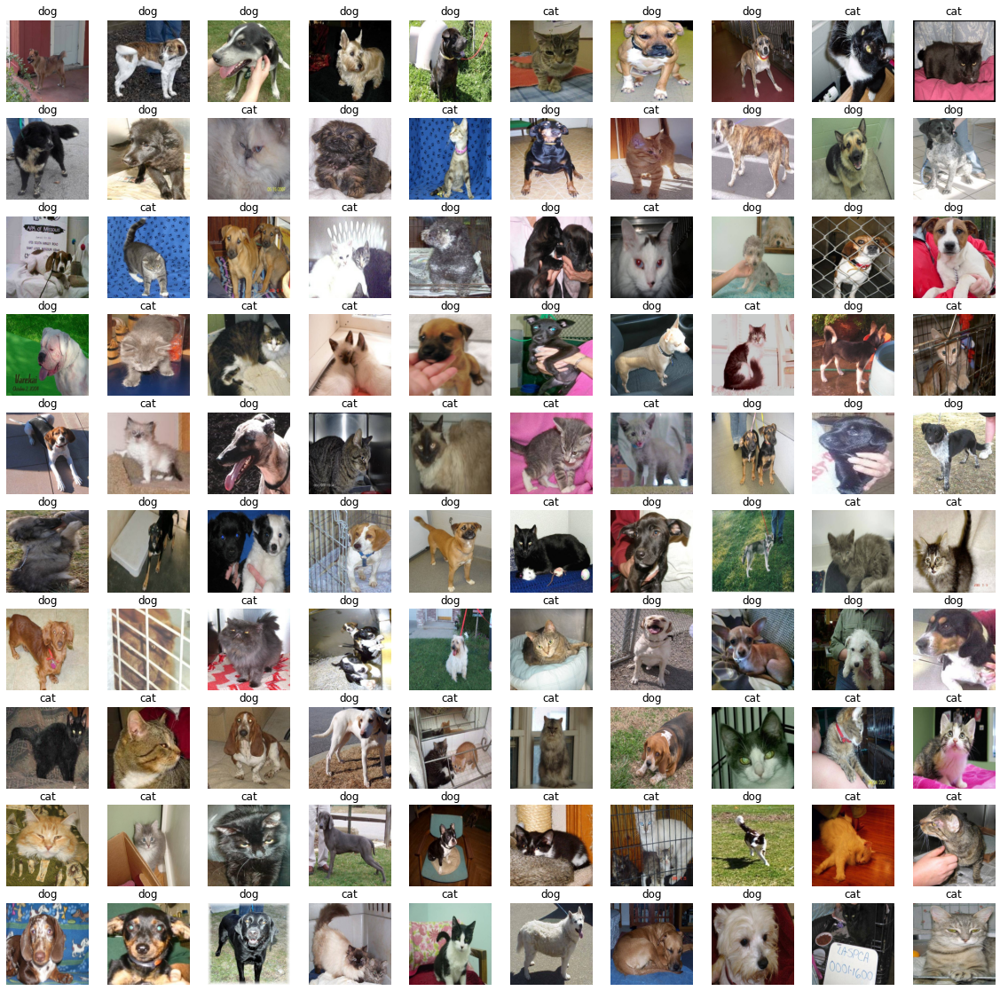

In [ ]:
plt.figure(figsize=(20, 20))
for i in range(200, 300):
  ax = plt.subplot(10, 10, i + 1 - 200)
  plt.imshow(image_list[i].numpy().astype("uint8"))
  label = predictions[i]
  plt.title(class_names[label])
  plt.axis("off")

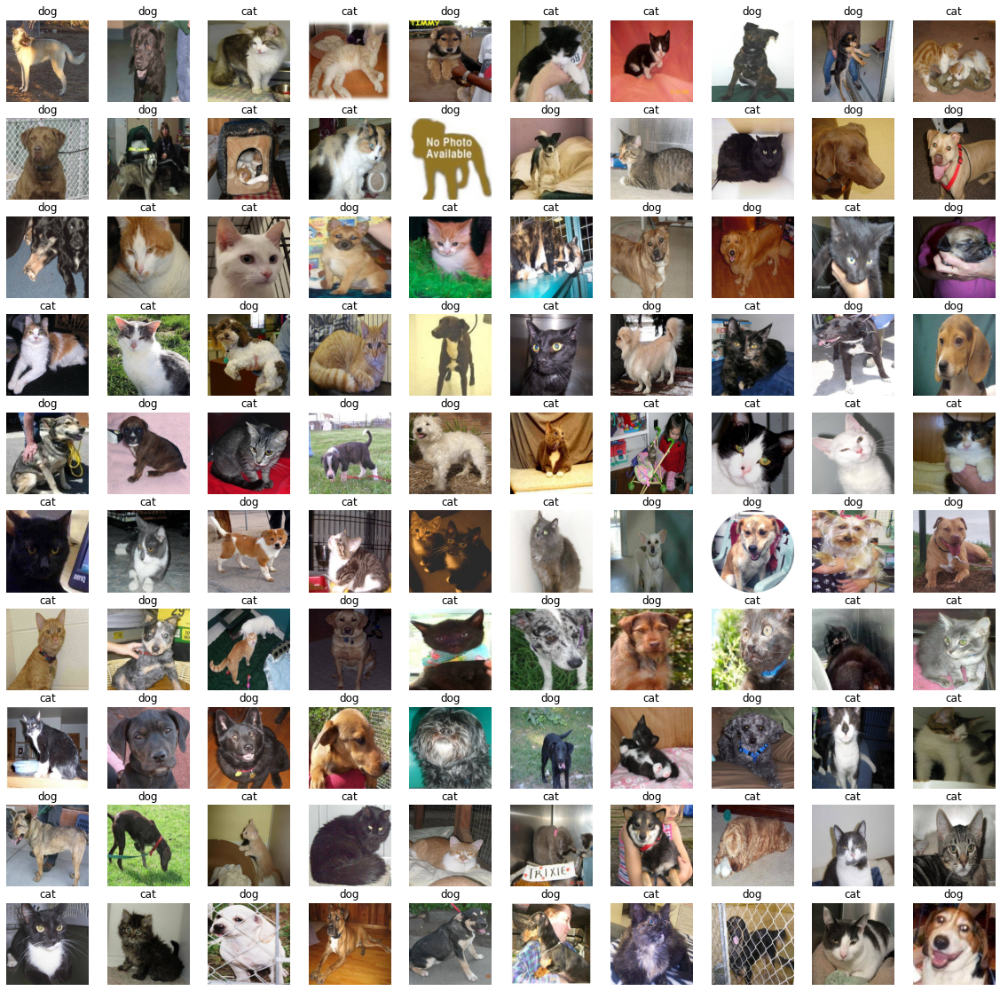

In [ ]:
plt.figure(figsize=(20, 20))
for i in range(300, 400):
  ax = plt.subplot(10, 10, i + 1 - 300)
  plt.imshow(image_list[i].numpy().astype("uint8"))
  label = predictions[i]
  plt.title(class_names[label])
  plt.axis("off")

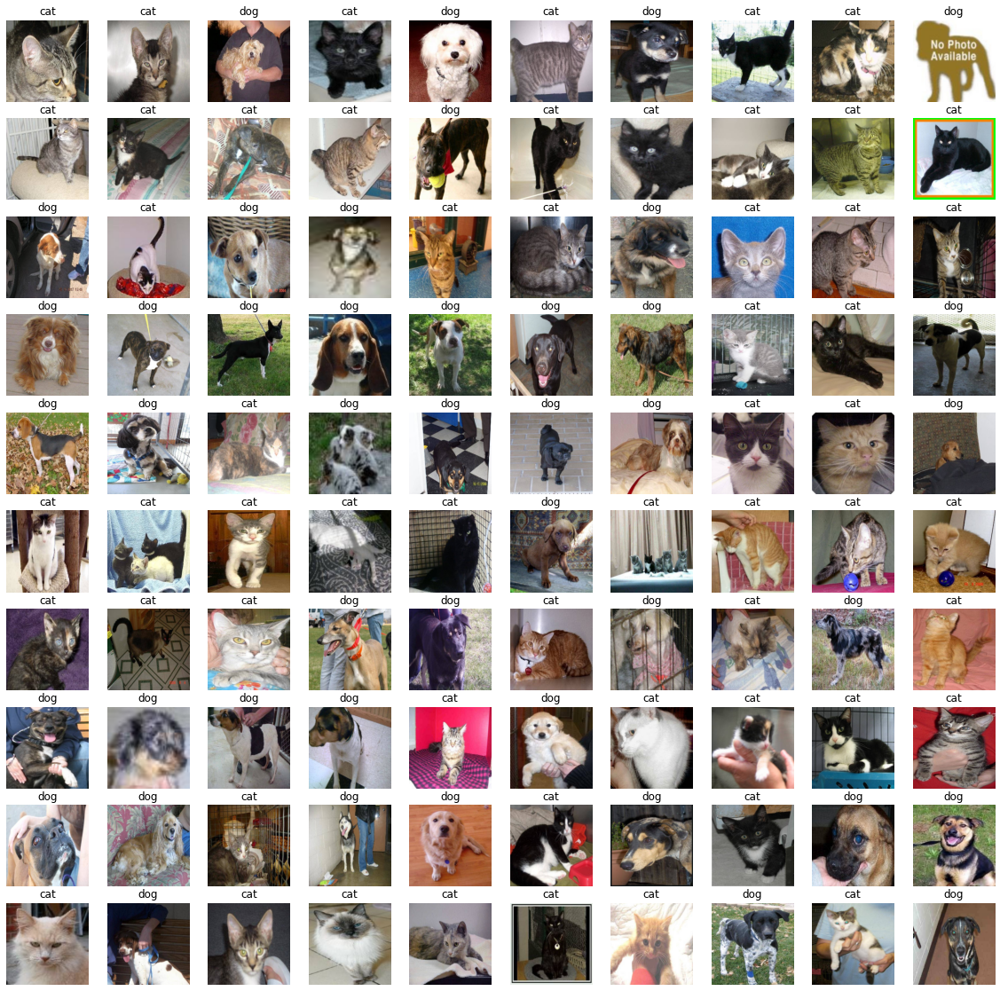

In [ ]:
plt.figure(figsize=(20, 20))
for i in range(400, 500):
  ax = plt.subplot(10, 10, i + 1 - 400)
  plt.imshow(image_list[i].numpy().astype("uint8"))
  label = predictions[i]
  plt.title(class_names[label])
  plt.axis("off")

In [ ]:
# Export predictions to submissions.csv file

